# Predicting Housing Prices in California

Presenting to you California Housing Prices Analysis Project. We are going to use the 1990 California Cenus dataset to study and try to understand how different attributes can make the house prices get higher or lower. What impact the location does have? what about the size of the house or the age of it?

Predicting Housing Prices in California

Welcome to the California Housing Prices Analysis! In this project, we are going to use the 1990 California Census dataset to study and try to understand how the different attributes can make the house prices get higher or lower. How does the location impact? How about the size of the house? The age?

This dataset has a lot of information that can help us. The main goal of this project is to build a Machine Learning Model in python that can learn from this data and make predictions of the median price of a house in any district, given all the other metrics provided in the dataset.
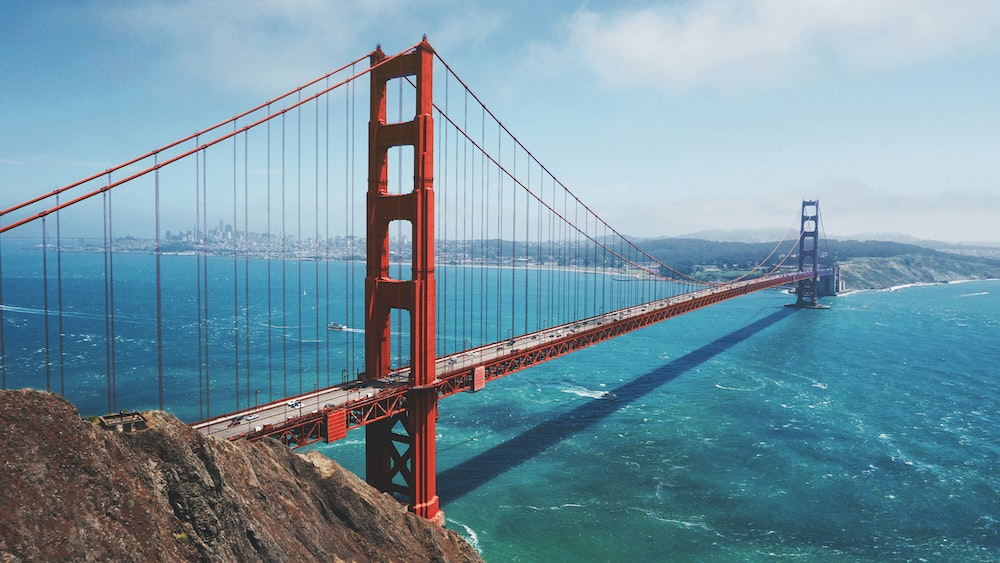

In [1]:
# Importing libraries needed
!pip install autoviz
import pandas as pd
import numpy as np
from scipy.stats import loguniform
import warnings
import random

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from autoviz.AutoViz_Class import AutoViz_Class

from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, cross_validate
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.pipeline import Pipeline


from xgboost import XGBRegressor
from skopt import gp_minimize

warnings.filterwarnings('ignore')
%matplotlib inline

seed = 123

#Some functions we're going to use through this project
def run_and_evaluate_model(housing_df, estimator, std_scaler = False, log = False, seed = seed):
    
    if log == True:
        y = housing_df['log_median_house_value']
        X = housing_df.drop(['median_house_value', 'log_median_house_value'], axis = 1)
    else:
        y = housing_df['median_house_value']
        X = housing_df.drop(['median_house_value'], axis = 1)
        
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=seed)
    
    
    if std_scaler == True:
        sc = StandardScaler()
        X_train = sc.fit_transform(X_train)
        X_test = sc.transform(X_test)
    try:
        modelo = estimator(random_state = seed)
    except:
        modelo = estimator()
    modelo.fit(X_train, y_train)
    y_pred = modelo.predict(X_test)
    
    if log == True:
        y_pred = np.exp(y_pred)
        y_test = np.exp(y_test)
    
    r2 = metrics.r2_score(y_test, y_pred).round(3)
    mse = round(np.sqrt(mean_squared_error(y_test,y_pred)),0)    
    
    return r2, mse

def run_and_evaluate_model_cv(housing_df, modelo, seed = seed):
    
    y = housing_df['median_house_value']
    X = housing_df.drop(['median_house_value'], axis = 1)
        
    modelo.fit(X, y)
    folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
    scores = cross_val_score(modelo, X, y, cv=folds)
    
    r2 = round(np.mean(scores),3)
    print("The R² of the model is: {}".format(r2))
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

housing_df= pd.read_csv('/kaggle/input/california-housing-dataset/housing.csv')
housing_df.head()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 33.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 83.8 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 83.0 MB/s eta 0:00:00:00:01
  Attempting uninstall: holoviews
    Found existing installation: holoviews 1.16.0
    Uninstalling holoviews-1.16.0:
      Successfully uninstalled holoviews-1.16.0


Imported v0.1.720. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [55]:
housing_df.shape

(20640, 10)

In [56]:
housing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


### So as we see there's not any missing data in our dataset

<Axes: >

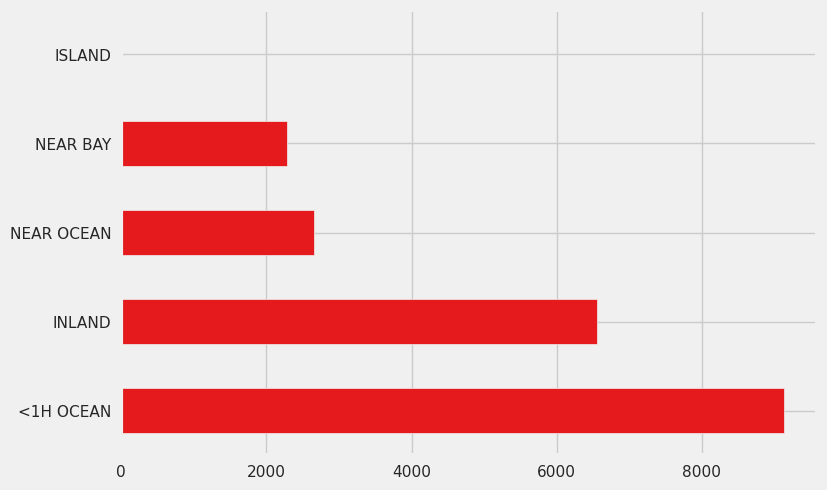

In [57]:
#exploring values of the ocean proximity feature
housing_df['ocean_proximity'].value_counts().plot(kind='barh')

In [58]:
housing_df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


<Axes: >

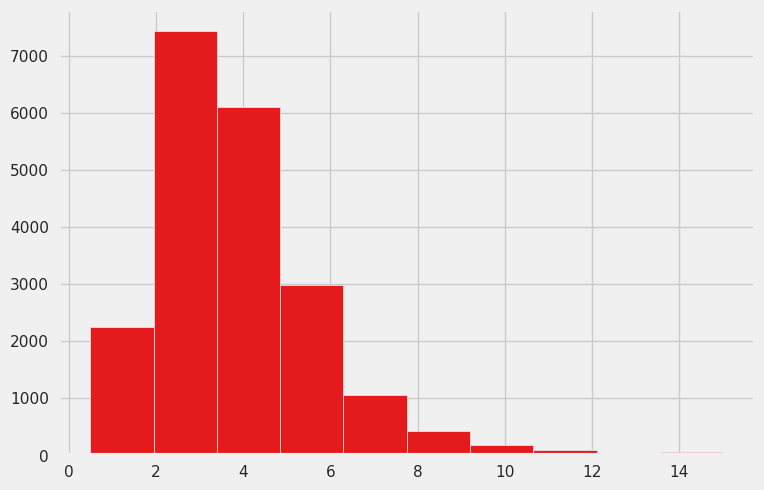

In [59]:
housing_df['median_income'].hist()

In [60]:
housing_df.duplicated().sum()

0

#### Changing the variables “unit”
We need to create new variables, to make sure that the information about rooms, bedrooms and population are in the same “unit” as our target.

### Exploring the relationship between variables :

Shape of your Data Set loaded: (20640, 10)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    9 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Regression problem #####################
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
longitude,float64,0.000000,NA,-124.350000,-114.310000,No issue
latitude,float64,0.000000,NA,32.540000,41.950000,has a high correlation with ['longitude']. Consider dropping one of them.
housing_median_age,float64,0.000000,NA,1.000000,52.000000,No issue
total_rooms,float64,0.000000,NA,2.000000,39320.000000,has 1287 outliers greater than upper bound (5698.38) or lower than lower bound(-1102.62). Cap them or remove them.
total_bedrooms,float64,1.002907,NA,1.000000,6445.000000,"207 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 1271 outliers greater than upper bound (1173.50) or lower than lower bound(-230.50). Cap them or remove them., has a high correlation with ['total_rooms']. Consider dropping one of them."
population,float64,0.000000,NA,3.000000,35682.000000,"has 1196 outliers greater than upper bound (3132.00) or lower than lower bound(-620.00). Cap them or remove them., has a high correlation with ['total_rooms', 'total_bedrooms']. Consider dropping one of them."
households,float64,0.000000,NA,1.000000,6082.000000,"has 1220 outliers greater than upper bound (1092.50) or lower than lower bound(-207.50). Cap them or remove them., has a high correlation with ['total_rooms', 'total_bedrooms', 'population']. Consider dropping one of them."
median_income,float64,0.000000,NA,0.499900,15.000100,has 681 outliers greater than upper bound (8.01) or lower than lower bound(-0.71). Cap them or remove them.
ocean_proximity,object,0.000000,0,nan,nan,1 rare categories: ['ISLAND']. Group them into a single category or drop the categories.
median_house_value,float64,0.000000,NA,14999.000000,500001.000000,has 1071 outliers greater than upper bound (482412.50) or lower than lower bound(-98087.50). Cap them or remove them.


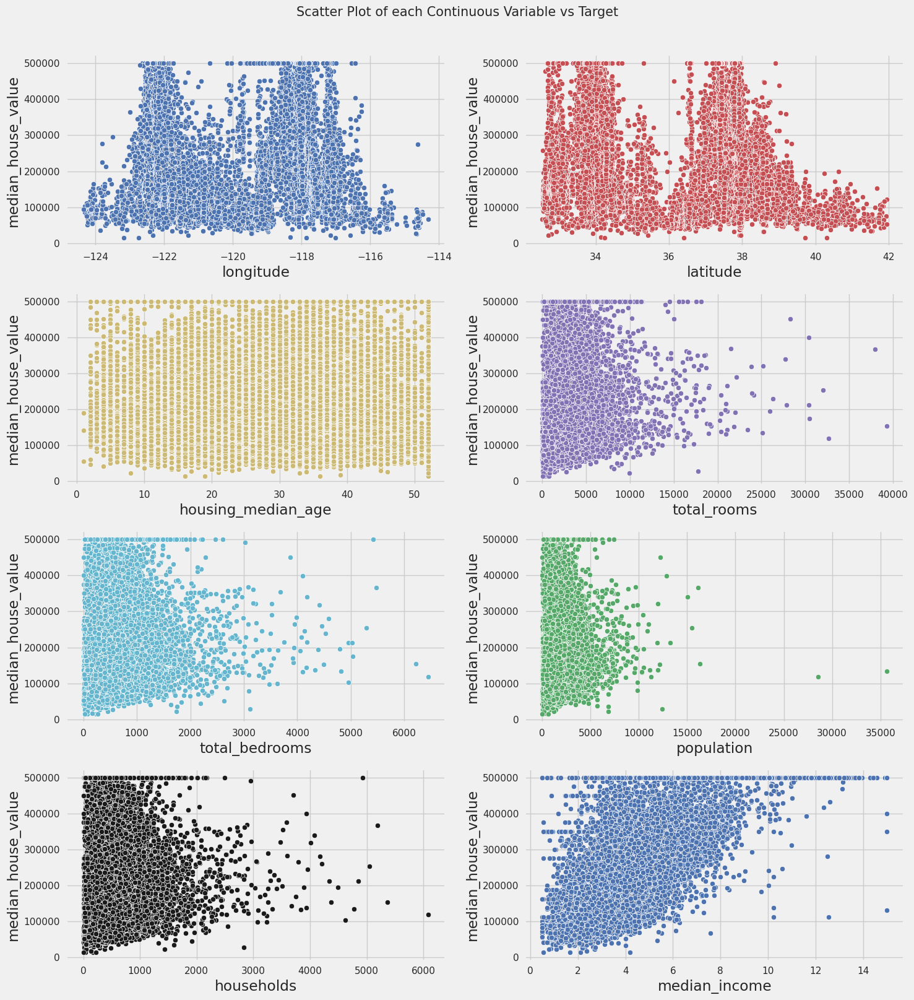

Number of All Scatter Plots = 36


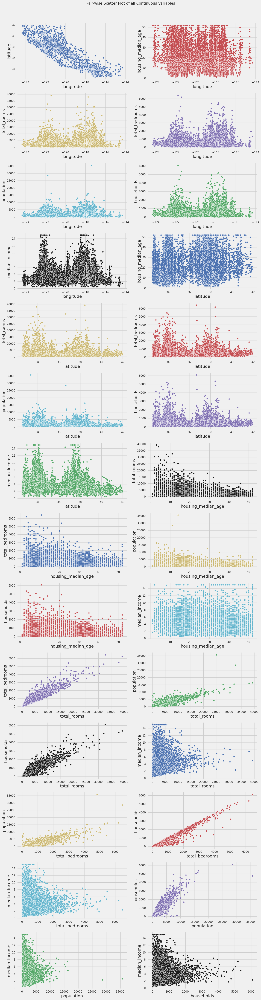

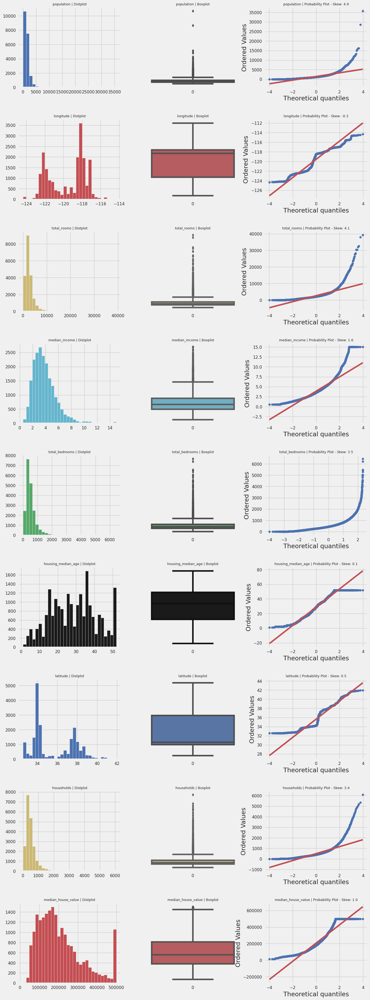

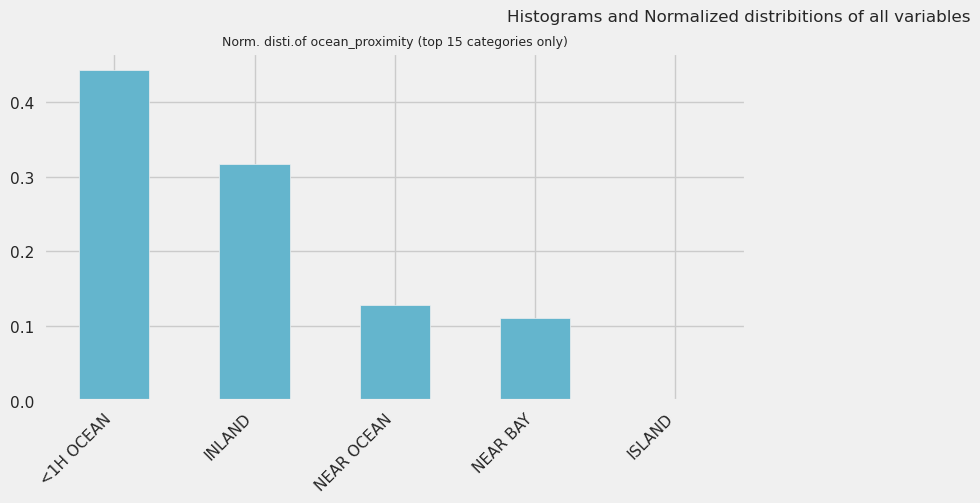

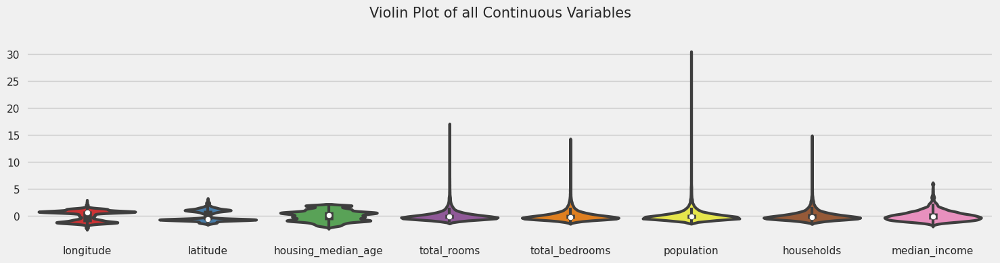

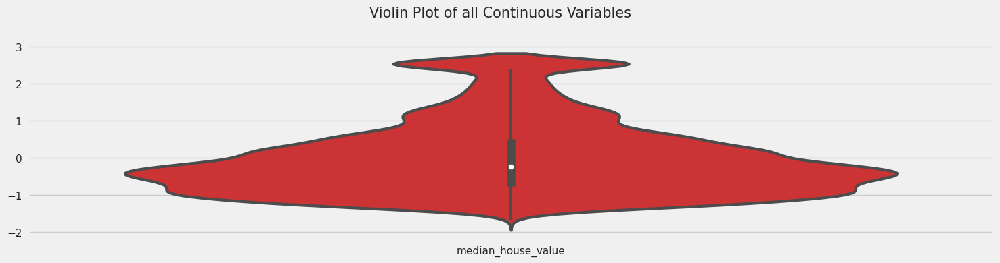

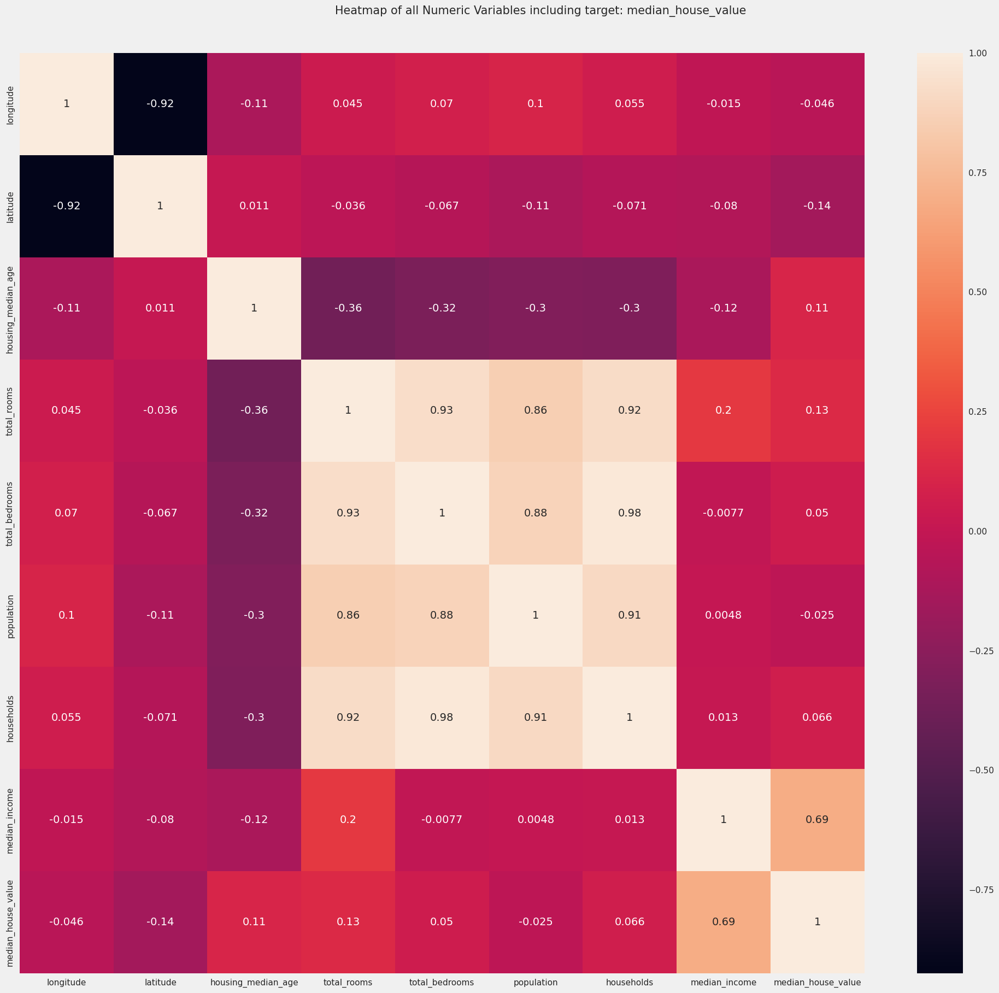

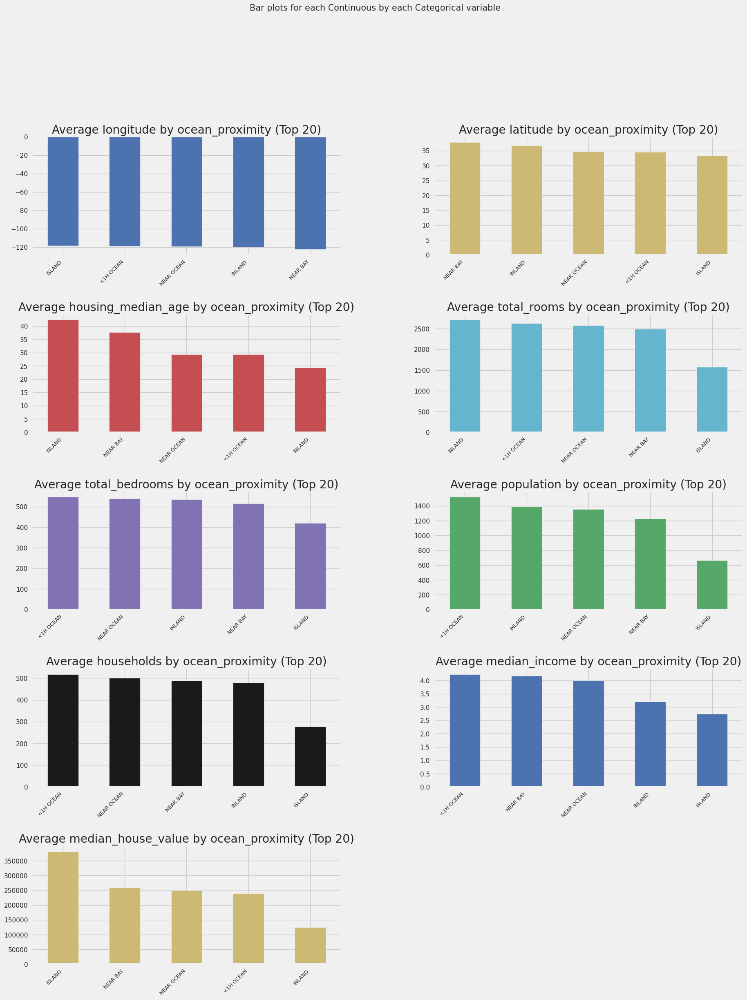

All Plots done
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [61]:
#Checking the distributions of our main variables using AutoViz
AV = AutoViz_Class()
dft = AV.AutoViz("", dfte=housing_df, depVar = 'median_house_value')

### Taking a look at the Autoviz report, something caught our attention: Let’s take a closer look at the relationship between the median income and median house value.

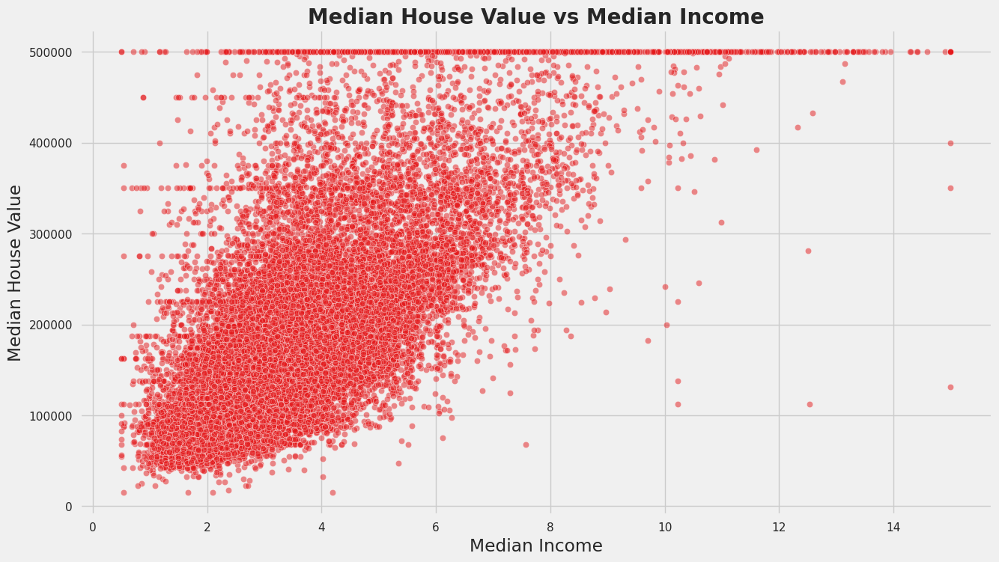

In [62]:
#plotting the median house value vs Median Income, that seems to be the strongest relationship
plt.figure(figsize=(14,8))
plt.title('Median House Value vs Median Income', fontsize=20, fontweight='bold')
sns.scatterplot(data= housing_df, x= 'median_income', y='median_house_value', alpha=0.5)
plt.xlabel('Median Income')
plt.ylabel('Median House Value')
plt.show()

#### There seem to be an issue with the median house value
First the maximum value of house was set at 500k USD and all the houses exceeding this value recieved the same limit amount
Second is those horizontal lines that appears in some specific points such as 450k, 350k and 275k, it looks uncommon. these values were probably misplaced
We have two options, we can simply drop all the records that have these values or we can identify the threshold to each of this quirks.
Since the dataset is big enough, these values represent a small percentage of the data (around 1%). We'll just drop them.

We already identified some issues with the dataset. Let’s start the data cleaning process!

# Cleaning the data.

In [63]:
#detecting missing values
total = housing_df.isnull().sum().sort_values(ascending=False)
percent_1= housing_df.isnull().sum()/ housing_df.isnull().count()*100
percent_2= (round(percent_1,1)).sort_values(ascending=False)
missing_data= pd.concat([total,percent_2], axis=1, keys=['Total', '%'])
missing_data

,Total,%
total_bedrooms,207,1.0
longitude,0,0.0
latitude,0,0.0
housing_median_age,0,0.0
total_rooms,0,0.0
population,0,0.0
households,0,0.0
median_income,0,0.0
median_house_value,0,0.0
ocean_proximity,0,0.0


## The idea is to fill the null values with the median, after grouping them in smaller subsets

In [64]:
#grouping the data in blocks of 20 values
housing_df['households_gp']= housing_df['households']//20

In [65]:
#filling the null values with the median
housing_df['total_bedrooms']= housing_df['total_bedrooms'].fillna(housing_df.groupby('households_gp')['total_bedrooms'].transform('median'))
#droping the value used for grouping
housing_df= housing_df.drop('households_gp', axis=1)

In [66]:
#checking back for null values
housing_df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

Now let's fix some of the issues we identified earlier:
1. Create new features to gurantee that all of them are in the same unit.
2. Data quirks

### First, let's create new features to make sure the information about rooms, bedrooms and population for each house are in the same unit as our target. 

In [67]:
#Creating useful features
housing_df['rooms_per_household']= housing_df['total_rooms']/housing_df['households']
housing_df['bedrooms_per_household']= housing_df['total_bedrooms']/housing_df['households']
housing_df['population_per_household']= housing_df['population']/housing_df['households']
#Statistics description of the new features
housing_df[['rooms_per_household','bedrooms_per_household','population_per_household']].describe()

,rooms_per_household,bedrooms_per_household,population_per_household
count,20640.000000,20640.000000,20640.000000
mean,5.429000,1.096590,3.070655
std,2.474173,0.473748,10.386050
min,0.846154,0.333333,0.692308
25%,4.440716,1.006504,2.429741
50%,5.229129,1.048970,2.818116
75%,6.052381,1.098941,3.282261
max,141.909091,34.066667,1243.333333


In [68]:
#removing the old variables
housing_df= housing_df.drop(['total_bedrooms', 'total_rooms', 'population'], axis=1)

### Looking at the descriptive statistics of the new variables, we might have spotted another issue: the max values for “population_per_household” and “rooms_per_household” are very above the expectations.

let's dig a little deeper and identifiy some rows of these extreme values to drop them in the next step.

In [69]:
housing_df['population_per_household'].sort_values(ascending=False)

19006    1243.333333
3364      599.714286
16669     502.461538
13034     230.172414
9172       83.171429
            ...     
4623        1.066176
19427       1.060606
19522       0.970588
5342        0.750000
11849       0.692308
Name: population_per_household, Length: 20640, dtype: float64

In [70]:
housing_df['rooms_per_household'].sort_values(ascending=False)

1914     141.909091
1979     132.533333
12447     62.422222
1913      61.812500
11862     59.875000
            ...    
17820      1.130435
14818      1.130435
3126       1.000000
8219       0.888889
5916       0.846154
Name: rooms_per_household, Length: 20640, dtype: float64

In [71]:
#dropping outliers
df_cleaned = housing_df.drop([1914,1979,3364,16669,19006]).reset_index(drop = True)
#New maximum values
df_cleaned[['rooms_per_household','bedrooms_per_household','population_per_household']].describe().iloc[7]

rooms_per_household          62.422222
bedrooms_per_household       15.312500
population_per_household    230.172414
Name: max, dtype: float64

### even though the new max value are still very high, they seem more plausible.

### Now let's eliminate the data quirks

In [72]:
#Eliminating data quirks
df_cleaned = df_cleaned[~df_cleaned['median_house_value'].isin([450000, 350000,275000,500000, 500001])].reset_index(drop= True)

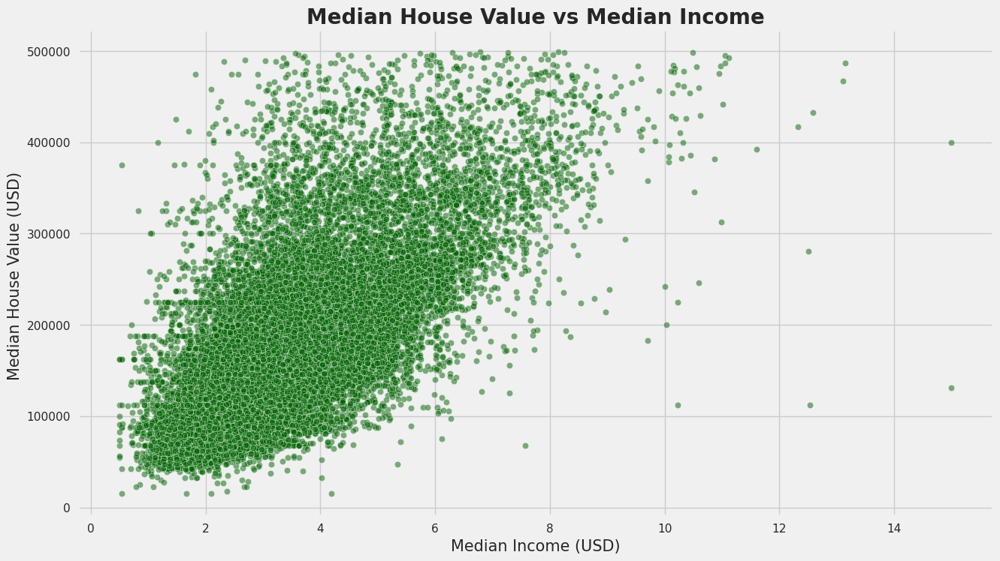

In [73]:
#Checking how data looks like after changes
plt.figure(figsize=(14,8))
plt.title('Median House Value vs Median Income', fontsize=20, fontweight='bold')
sns.scatterplot(data= df_cleaned, x= 'median_income', y='median_house_value', alpha=0.5, color='darkgreen')
plt.xlabel('Median Income (USD)', fontsize=15)
plt.ylabel('Median House Value (USD) ',fontsize=15)
plt.show()

Now that looks way more real!

That’s all the cleaning for now, let’s dig a little digger in our EDA.

In [74]:
#adjusting the values of ocean proximity
ocean_proximity_upd= {'NEAR BAY':'near_bay','<1H OCEAN':'less_1hour_to_ocean','INLAND':'inland','NEAR OCEAN':'near_ocean', 'ISLAND':'island'}
data= [housing_df, df_cleaned]
for dataset in data:
    dataset['ocean_proximity']= dataset['ocean_proximity'].map(ocean_proximity_upd)
    

# Explatory Data Analysis
## Geospatial data
First of all, let’s see how our target behaves in a map. How important is the location to determine the median house value?

* we are going to use to original data and not the cleared one because even the dirty data will help us understand some patterns

In [75]:
#Creating a smaller sample to avoid polluting the map
small_df = housing_df.sample(frac=0.4, random_state=123)

#Plotting the map using the mapbox api
mapbox_access_token = 'pk.eyJ1IjoiZGFuaWVsZWxpZXplciIsImEiOiJja2ZoYndyY3owMWtlMnVvN2Jwb3hqbTFtIn0.VHGksAhQ1blX1r0RUb9zMw'
px.set_mapbox_access_token(mapbox_access_token)
fig= px.scatter_mapbox(small_df, lat= 'latitude', lon= 'longitude', zoom=4, color='median_house_value', color_continuous_scale=px.colors.diverging.RdBu_r, opacity=0.2)
fig.show()


## Through the map we can spot few interesting things:
1. that all the red spots are relatively close to the ocean which highlights the importance of the ocean proximity in our analysis
2. in Los Angelos, the cities near the Bay,Sant Barbra and San Diego, have lots of expenseive houses.
3. Even though the capital of the State is Sacraemento, most of the blocks of the city have low-budget houses.
4. As we move from the ocean to the interior, the price of houses drops substantially. The fact that there's a lot of mountainous regions in the center/west might contribute to this behaviour.
5. The north of the state doesn't have red spots even near the ocean.

# Categorical Values: Ocean proximity
We were able to see very clearly on the map the importance of the geospatial position in determining the value of the house. In our model, the categorical value "ocean proximity" will also help a lot, since it's hard for some models to learn from latitude/longitude. Let's see the price of houses are related to this categories:

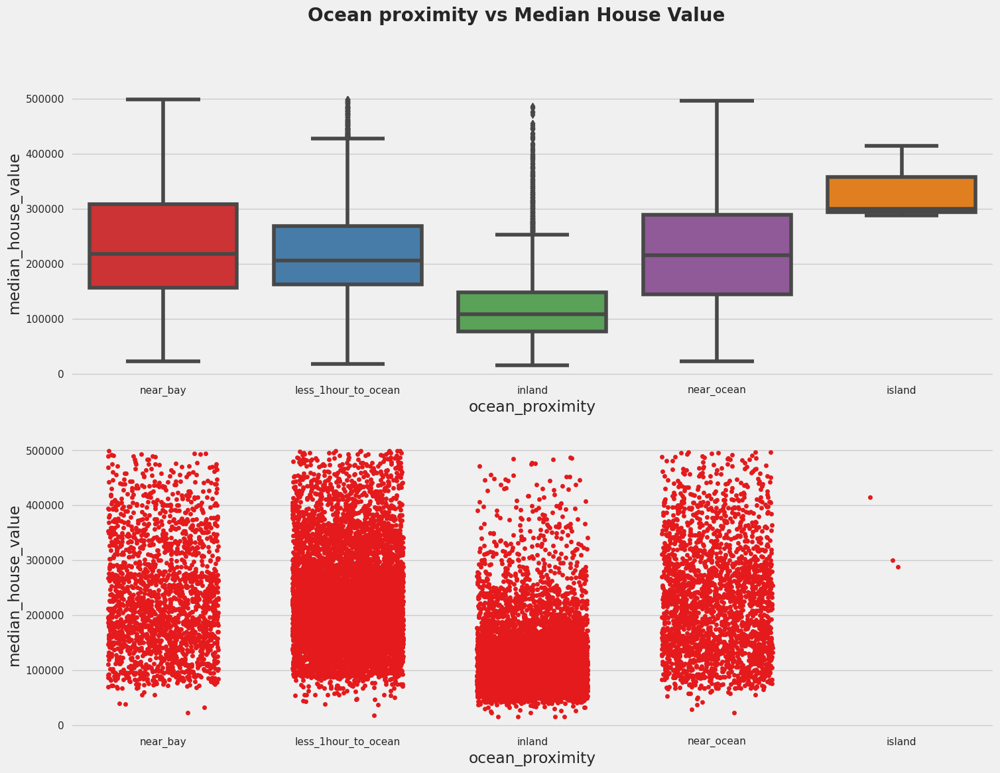

In [76]:
fig, axes= plt.subplots(2,1, figsize=(16,12))
plt.suptitle('Ocean proximity vs Median House Value', fontsize=20, fontweight= 'bold')
sns.boxplot(ax= axes[0], data= df_cleaned, x='ocean_proximity', y='median_house_value')
sns.stripplot(ax=axes[1], data= df_cleaned, x='ocean_proximity', y='median_house_value', jitter=0.3)
plt.show()

We can notice from the figuers that houses with the categories 'near bay', 'near ocean',and 'less than 1h to ocean' are more expensive than those inland.

#### Furthermore, We can create new categories to separate the north coast from the rest: Above the latitude of 38.20 as we noticed in the map that we had red spots all over the coast… except for the northern part of the state, where we had cheaper houses even on the coast.



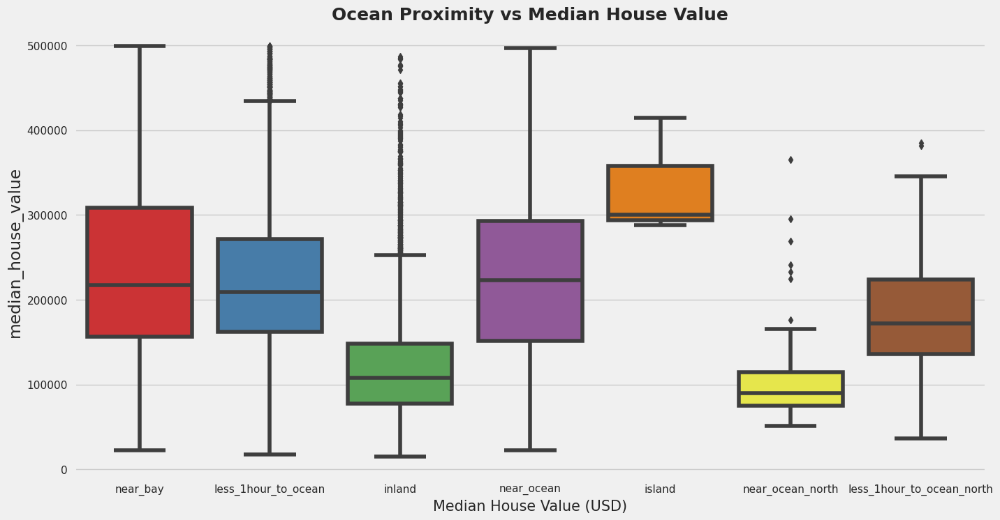

In [77]:
#Creating new df with the ocean category exchanged
df_cleaned_ocean_loc = df_cleaned.copy()
df_cleaned_ocean_loc2 = df_cleaned.copy()

df_cleaned_ocean_loc['ocean_proximity_new'] = df_cleaned_ocean_loc['ocean_proximity'] 
df_cleaned_ocean_loc.loc[(df_cleaned_ocean_loc['ocean_proximity']=='less_1hour_to_ocean')&(df_cleaned_ocean_loc['latitude'] > 38.2),'ocean_proximity_new'] = 'less_1hour_to_ocean_north'
df_cleaned_ocean_loc.loc[(df_cleaned_ocean_loc['ocean_proximity']=='near_ocean')&(df_cleaned_ocean_loc['latitude'] > 38.2),'ocean_proximity_new'] = 'near_ocean_north'

# putting the new categories in the end of the dataframe 
new = pd.concat([df_cleaned_ocean_loc[df_cleaned_ocean_loc['ocean_proximity'] == df_cleaned_ocean_loc['ocean_proximity_new']], df_cleaned_ocean_loc[df_cleaned_ocean_loc['ocean_proximity'] != df_cleaned_ocean_loc['ocean_proximity_new']]])

fig = plt.figure(figsize=(15,8))
plt.title('Ocean Proximity vs Median House Value', fontsize = 18, fontweight = 'bold')
sns.boxplot(data = new, x="ocean_proximity_new", y="median_house_value");
plt.xlabel('Ocean Proximity', fontsize = 15)
plt.xlabel('Median House Value (USD)', fontsize = 15)

df_cleaned_ocean_loc = df_cleaned_ocean_loc.drop("ocean_proximity", axis = 1)

That's good!
We see a big difference between northern data and southern data
We'll keep these changes in a separated dataset and see if it can help with the machine learning models later.

## Numerical Data
let's plot the correlation matrix to see how the numerical variables are related to each other.

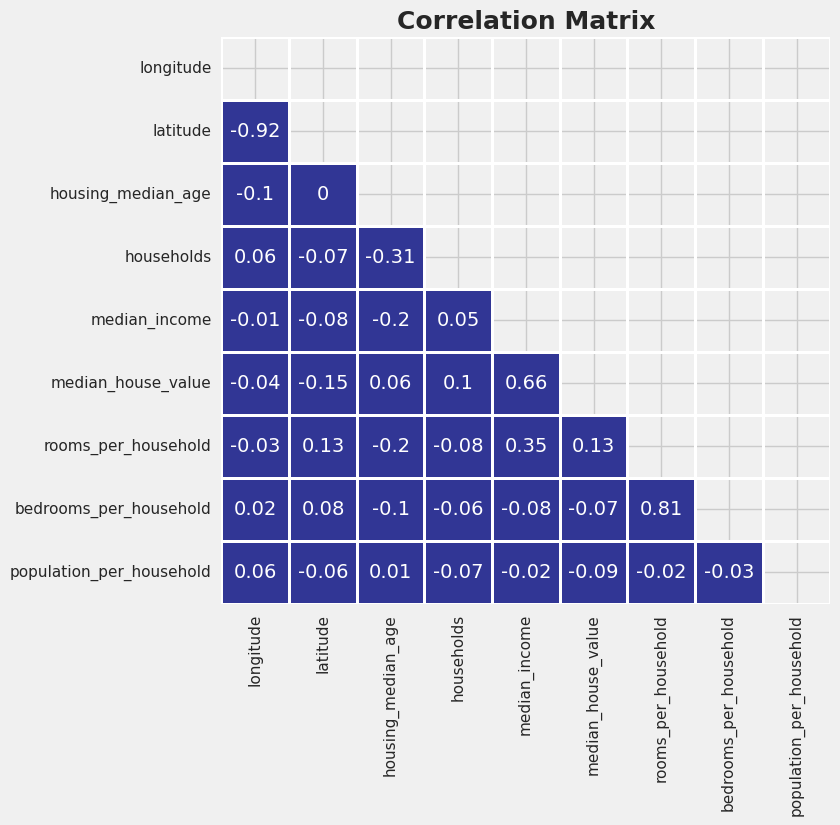

In [78]:
# checking the correlation matrix
corr_mat= df_cleaned.corr().round(2)
f, ax= plt.subplots(figsize=(7,7))
mask= np.zeros_like(corr_mat, dtype=np.bool)
mask[np.triu_indices_from(mask)]=True
sns.heatmap(corr_mat, mask= mask, vmin=1,vmax=1, center=0, cmap='RdYlBu', square=False, lw=2, annot=True, cbar=False)
plt.title('Correlation Matrix', fontsize=18, fontweight='bold')
plt.show()

Taking a look at our correlation matrix, there aren’t many big discoveries. All the strong relations were kind of obvious and we could see it coming: the more people live on a block, the more rooms there are. The more households there are in a block, the more bedrooms there are, etc. The more useful (but also a little obvious) information we could extract is that: the higher the median household income, the more expensive the house.

Let me open a quick parenthesis: One interesting thing is that the coefficient for median house age and median house value is slightly positive: The older the house, the more expensive it is. Of course, knowing the context, we might suspect that this doesn’t actually make sense.

Digging a little deeper, we can see why:

In [79]:
temporary_df = df_cleaned.copy()
temporary_df['housing_median_age_group'] = temporary_df['housing_median_age']//10*10
temporary_df = temporary_df.groupby(['housing_median_age_group', 'ocean_proximity']).count()[['longitude']].rename({'longitude':'count'}, axis = 1).reset_index()
temporary_df['percentage'] = 100*temporary_df['count']/temporary_df.groupby('housing_median_age_group')['count'].transform(np.sum)
fig = px.bar(temporary_df, x="housing_median_age_group", y="percentage", color="ocean_proximity",
             title="Percentage of Houses per Location grouped by Age",
             labels={"housing_median_age_group": "Median Age Group", "percentage": "Percentage of Houses"})

fig.show()

The newer the house, the higher probability that is located inland

### Continuing with our EDA
Let's plot the relation between the median income and median house values, since they have a strong relationship.



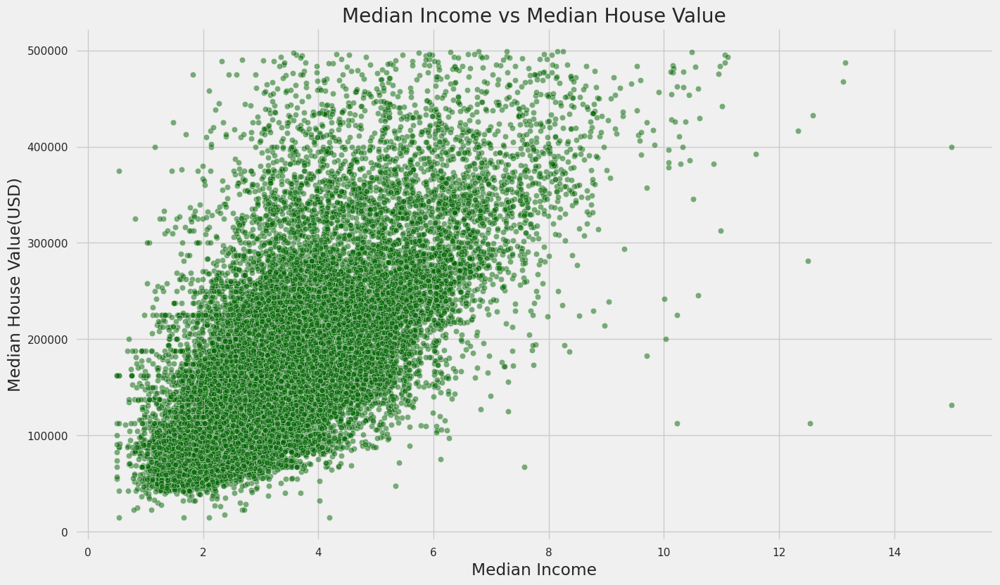

In [80]:
plt.figure(figsize=(15,9))
plt.title('Median Income vs Median House Value')
sns.scatterplot(data= df_cleaned, x= 'median_income', y='median_house_value', alpha=0.5, color='darkgreen')
plt.xlabel('Median Income')
plt.ylabel('Median House Value(USD)')
plt.show()

We can spot a 'cone' form that might not be great for the linear model. This effect also appears in other relations. In some cases, using the logarithm of the features can help the model to make better predictions. Let's create a separated dataframe, to check these new log-transformed features can help.

<Axes: title={'center': 'Median House Values vs Median Income'}, xlabel='log_median_income', ylabel='log_median_house_value'>

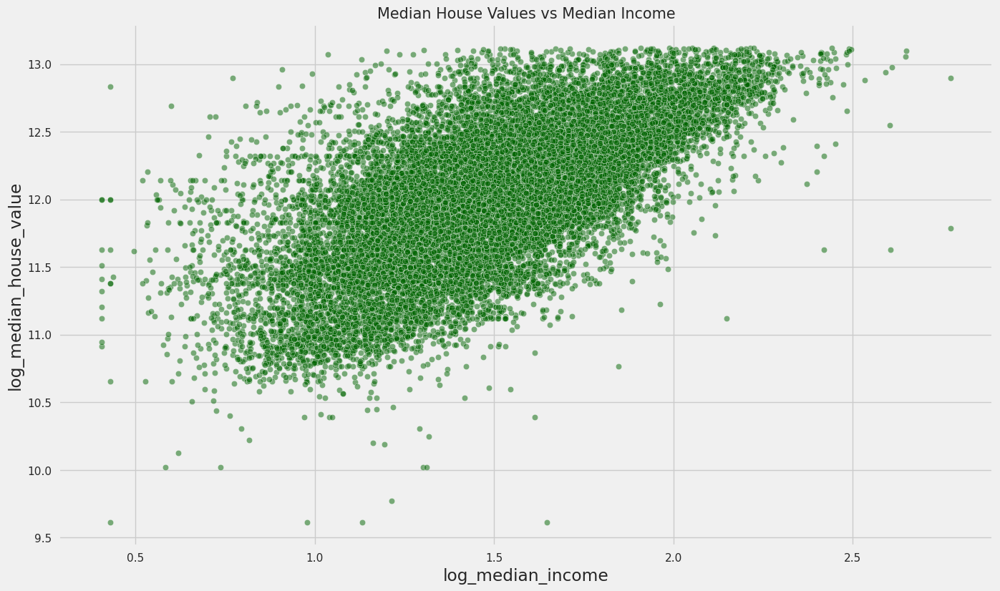

In [81]:
## creating a log dataframe 
list_log= ['housing_median_age', 'median_income', 'median_house_value', 'rooms_per_household','population_per_household', 'bedrooms_per_household']
df_with_log= df_cleaned.copy()
for col in list_log:
    name_log = 'log_' + str(col)
    df_with_log[name_log] = np.log(df_with_log[col] + 1) 
#plotting the log of the median income vs log median house value
plt.figure(figsize=(15,9))
plt.title('Median House Values vs Median Income', fontsize=15)
sns.scatterplot(data= df_with_log, x='log_median_income', y='log_median_house_value', alpha=0.5, color='darkgreen')

In [82]:
#comparing the pearson correlation cofficient with and without log
df_with_log.corr().loc[['median_house_value','log_median_house_value'],['median_income','log_median_income']]

,median_income,log_median_income
median_house_value,0.662462,0.647007
log_median_house_value,0.653569,0.664769


For the log features, the Pearson Coefficient is slightly better. We'll check in the next steps if using those can have a positive impact in our model.

# Building our first Machine Learning Model
we are going to figure out the best fitting model for our problem whether it's Linear, Tree-based, SVR or Neighbors-based.

We'll have to transform the ocean_proximity column, since some models don't handle categorical variables very well. We are going to use the one-hot-encoding method.

In [83]:
## Creating dummy variables to the ocean proximity column
df_cleaned= pd.get_dummies(df_cleaned, columns=['ocean_proximity']).drop('ocean_proximity_island',axis=1)
df_with_log= pd.get_dummies(df_with_log, columns=['ocean_proximity']).drop('ocean_proximity_island', axis=1)

Now, we are going to select one model of each type (between linear, tree-based, neighbors and SVR) to see which performs better, and how that performance changes with some transformations (log-transformation and standardizing the variables).

In [84]:
dict_modelos ={
    'LinearRegression':LinearRegression,      # linear model
    'KNeighbors': KNeighborsRegressor,        # neighbors
    'RandomForest': RandomForestRegressor,    # tree-based
    'SVR':svm.SVR                             # SVR
    }

    
# creating dict to store the results from each model, with the transformations
result_models = {}
result_models_std = {}
result_models_log = {}
result_models_std_log = {}


# no log and no std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_cleaned, value, std_scaler = False)
    result_models[key] = r2


# no log and with std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_cleaned, value, std_scaler = True)
    result_models_std[key] = r2


# with log and no std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_with_log, value, std_scaler = False, log = True)
    result_models_log[key] = r2


# with log and with std_scaler
for key, value in dict_modelos.items():
    r2, mse = run_and_evaluate_model(df_with_log, value, std_scaler = True, log = True)
    result_models_std_log[key] = r2
    

# joining the results in a single df
df_results = pd.DataFrame([result_models, result_models_std, result_models_log, result_models_std_log])
df_results.index = ['no_std_no_log', 'with_std_no_log', 'no_std_with_log', 'with_std_with_log']
df_results

,LinearRegression,KNeighbors,RandomForest,SVR
no_std_no_log,0.604,0.250,0.797,-0.022
with_std_no_log,0.604,0.709,0.797,-0.013
no_std_with_log,0.635,0.242,0.801,0.205
with_std_with_log,0.635,0.718,0.801,0.763


Looking at the results we can spot that linear models weren't great. Our attempt to use the log in numerical values did improve the model, but the R² values were far behind other options.

The model that has the best is the random forest, let's try to imporve it even further. 

## Optimising Random Forest model

We'll make some attempts to get a better result: removing variables, creating new ones, and performing a hyperparameter optimization. Finally, we'll check if there is some other tree-based model that can outperform the Random Forest.

Note: For now on we'll use cross validation to evaluate the model, as we seek for more reliability that our changes are helping the model, and that's not due to randomness. Therefore, we must re-evaluate the model to get a new baseline with cross-validation.

In [85]:
#applying cross validation using a new baseline
run_and_evaluate_model_cv(df_cleaned, RandomForestRegressor(random_state=seed))

The R² of the model is: 0.799


Now let's check which features are more important for the model to evaluate the results. We can try remove the least important features to see if it improves our model.

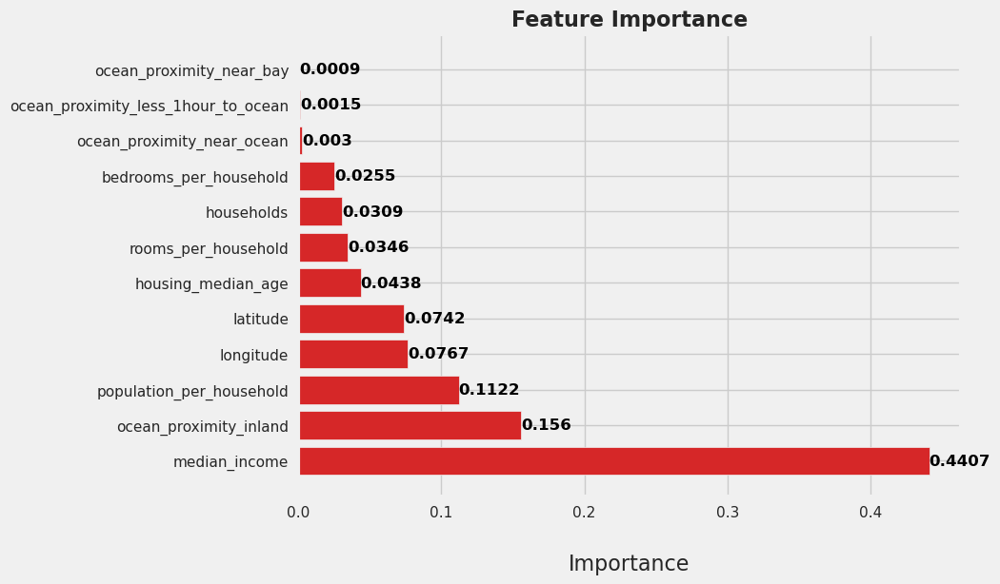

In [86]:
# Checking the feature importance
y = df_cleaned['median_house_value']
x= df_cleaned.drop(['median_house_value'], axis=1, errors='ignore')

rf_model= RandomForestRegressor(random_state=seed)
rf_model.fit(x,y)

fi_df= pd.DataFrame({'Feature':list(x.columns), 'Importance':rf_model.feature_importances_})
fi_df = fi_df.sort_values('Importance', ascending=False).reset_index(drop=True)

plt.figure(figsize=(8,6))
plt.barh(y= fi_df['Feature'], width=fi_df['Importance'], color='tab:red')
plt.title('Feature Importance', fontsize=16, fontweight= 'bold')
plt.xlabel('Importance', fontsize=16, labelpad=25)

for index, value in enumerate(fi_df['Importance'].round(4)):
    plt.text(value,index, str(value), color='black', fontweight='bold', fontsize=12, verticalalignment='center')

plt.show()


In [87]:
# Removing least important features
run_and_evaluate_model_cv(df_cleaned.drop(['ocean_proximity_near_bay', 'ocean_proximity_less_1hour_to_ocean','ocean_proximity_near_ocean'], axis=1), RandomForestRegressor(random_state=seed))

The R² of the model is: 0.799


Despite sometimes removing the least features should give us better results, the evaluation of our model didn't get any better. We'll just move with all of the original features

# Creating new features

Now we are going to see the random forest model performed on 'df_cleaned_loc' where we created additional categories for the ocean proximity data, separating the northern part from the state of others.

In [88]:
# Evaluating the df_cleaned_loc dataset
df_cleaned_ocean_loc= pd.get_dummies(df_cleaned_ocean_loc, columns=['ocean_proximity_new']).drop('ocean_proximity_new_island',axis=1)
run_and_evaluate_model_cv(df_cleaned_ocean_loc, RandomForestRegressor(random_state=seed))

The R² of the model is: 0.8


Well unfortunately the changes didn't make any improvements on the tree-based model.

Next, we are using K-means model to cluster the data and create a new cluster variable with these results to improve the model.

# Creating a geographic cluster feature
Since the main goal here is to help the model with the geospatial data, we are going to fit the algorithm only with the values of latitude and longitude. That way, the different clusters won't overlap in the map.
At this point, we'll have some technical challenges here: We'll need to build a pipeline, to prevent data leakage (when the information outside the training set is used to create the model). Not only that, having a pipeline will make it easier to optimize the hyperparameters, since we'll try to get the best combination between the parameters from the KMeans model, and the regression model itself.

To use the pipeline from sklearn, we'll need to create a class that uses the KMeans as a transformation step that will create a new feature to pass to the main model. We're going to be super-creative and call it KMeansTransformer.

In [89]:
class KMeansTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, n_clusters=25, max_iter = 200, random_state = seed):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.random_state = seed
        self.model = KMeans(n_clusters, random_state = seed, max_iter = max_iter)

    def fit(self,X,y=None):
        self.model.fit(X[['latitude','longitude']])
    
    
    def transform(self,X,y=None):
        X['cluster']= self.model.predict(X[['latitude','longitude']]).reshape(-1,1)
        return X
    
    def fit_transform(self, X, y=None):
        self.fit(X[['latitude','longitude']])
        return self.transform(X)

pipe = Pipeline([("clusterization", KMeansTransformer(random_state = seed)),
                 ("regressor", RandomForestRegressor(random_state = seed))])
run_and_evaluate_model_cv(df_cleaned, pipe)

The R² of the model is: 0.804


That's good news. Using the K-Means to create a cluster column really helped the model.
Let's check how these cluster look on the map (using MapBox API)

We established an initial number of clusters of 25, that might change later.

In [90]:
df_cleaned_cluster= df_cleaned.copy()
KMT30 = KMeansTransformer(n_clusters=25, random_state=seed)
KMT30.fit_transform(df_cleaned_cluster)

mapbox_access_token =  'pk.eyJ1IjoiZGFuaWVsZWxpZXplciIsImEiOiJja2ZoYndyY3owMWtlMnVvN2Jwb3hqbTFtIn0.VHGksAhQ1blX1r0RUb9zMw'
px.set_mapbox_access_token(mapbox_access_token)
fig = px.scatter_mapbox(df_cleaned_cluster, lat="latitude", lon="longitude", zoom=4, color="cluster",
                        color_continuous_scale=px.colors.diverging.RdBu_r, opacity = 0.2)
fig.show()

# Hyperparameter Optimization
We will try to optimize the model by applying Bayesian optimization. We will provide the model with a range of values of the hyperparameters that we want to tune, and it will randomly search for a combination of values that gives the best result. 

After some random itterations we will be able to find the best combination, and the algorith will keep searching for values near this spot, using gaussian processes.

First, we try to apply it on the Random Forest model.

In [91]:
def train_model_rf(params):
    n_clusters = params[0]
    n_estimators = params[1]
    min_samples_leaf = params[2]
    max_depth = params[3]
    max_features = params[4]
     
    print(params, '\n')
    mdl = Pipeline([("clusterization", KMeansTransformer(n_clusters = n_clusters)),
                     ("regressor", RandomForestRegressor(n_estimators = n_estimators,
                                            min_samples_leaf = min_samples_leaf,
                                            max_depth = max_depth,
                                            max_features = max_features))])
    mdl.fit(x, y)
    folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
    scores = cross_val_score(mdl, x, y, cv=folds)
    return -round(np.mean(scores),3)

space_rf = [[10,15,20,25,30,35, 40], # n_cluster
          [100,200,400,800,1200,1600,2000,2400, 2700], # n_estimators
          [1,2,3,4,5,10,15,22,30], # min sample leaf
          [None], # max_depth
         ['auto','sqrt','log2']] # max_features
resultados_gp = gp_minimize(train_model_rf, space_rf, random_state=seed, verbose=1, n_calls=37, n_random_starts=25)
resultados_gp.x

Iteration No: 1 started. Evaluating function at random point.
[30, 800, 15, None, 'log2'] 

Iteration No: 1 ended. Evaluation done at random point.
Time taken: 99.3640
Function value obtained: -0.7820
Current minimum: -0.7820
Iteration No: 2 started. Evaluating function at random point.
[35, 800, 10, None, 'log2'] 

Iteration No: 2 ended. Evaluation done at random point.
Time taken: 105.4036
Function value obtained: -0.7920
Current minimum: -0.7920
Iteration No: 3 started. Evaluating function at random point.
[30, 800, 3, None, 'log2'] 



KeyboardInterrupt: 

In [92]:
pipe_rf= Pipeline([('clusterization', KMeansTransformer(random_state=seed, n_clusters=25)),('regressor', RandomForestRegressor(random_state=seed, n_estimators=800, min_samples_leaf=1, max_depth=None, max_features='log2'))])
run_and_evaluate_model_cv(df_cleaned, pipe_rf)

The R² of the model is: 0.822


We notice here a signficant improvement as it went from 0.8 to 0.822

# Trying another type of model

We are going to use Xgboost model to see if it can get us a better result.

Again, we will be using bayesian optimization

In [ ]:
def train_model_xgb(params):
    n_clusters = params[0]
    n_estimators = params[1]
    learning_rate = params[2]
    max_depth = params[3]
    min_child_weight = params[4]
    subsample = params[5]
    num_parallel_tree = params[6]
    
    print(params, '\n')
    mdl = Pipeline([("clusterization", KMeansTransformer(n_clusters = n_clusters)),
                    ("regressor", XGBRegressor(n_estimators = n_estimators,
                                           learning_rate = learning_rate,
                                           max_depth = max_depth,
                                           min_child_weight = min_child_weight,
                                           subsample = subsample,
                                           num_parallel_tree = num_parallel_tree))])
    mdl.fit(x, y)
    folds = KFold(n_splits = 4, shuffle = True, random_state = seed)
    scores = cross_val_score(mdl, x, y, cv=folds)
    return -round(np.mean(scores),3)
space_xgb = [list(range(15, 40)), # n_cluster 
          list(range(100, 2400)), # n_estimators
          loguniform.rvs(1e-3, 1, size=1000, random_state=seed), # learning_rate
          list(range(2, 7)), # max_depth
          list(range(2, 30)), # min_child_weight
          np.linspace(0.05, 1).tolist(), # subsample
          list(range(2, 5))] # num_parallel_tree
resultados_gp = gp_minimize(train_model_xgb, space_xgb, random_state=seed, verbose=1, n_calls=60, n_random_starts=40)
resultados_gp.x

In [93]:
#XGB optimized 
y= df_cleaned['median_house_value']
X= df_cleaned.drop(['median_house_value'], axis=1)

pipe_xgb_tuned= Pipeline([('clusterization', KMeansTransformer(n_clusters=32)),('regressor', XGBRegressor(random_state=seed, n_estimators= 1085, learning_rate=0.10595107822603367, max_depth=5, min_child_weight=15, subsample= 0.786734693877551, num_parallel_tree= 3))])
run_and_evaluate_model_cv(df_cleaned, pipe_xgb_tuned)

The R² of the model is: 0.844


The XGBoost shows much better performance than Random Forest.

# Which kind of features were more helpful?
After we got our final model, we are going to see which kind of features were more important to make the predictions:
Features about the geographic location, about the house and number of residents, or the income of family.

We'll try the model with removing the features of each kind.

In [94]:
# dropping info about the house
df_without_house_info = df_cleaned.drop(['housing_median_age', 'rooms_per_household','bedrooms_per_household','population_per_household'], axis=1)

y= df_without_house_info['median_house_value']
X= df_without_house_info.drop(['median_house_value'], axis=1)


pipe_xgb_tuned.fit(X,y)
folds= KFold(n_splits=4, shuffle=True, random_state= seed)

run_and_evaluate_model_cv(df_without_house_info,pipe_xgb_tuned)



The R² of the model is: 0.819


In [95]:
# dropping info about the income
df_without_income_info= df_cleaned.drop(['median_income'], axis=1)

y= df_without_income_info['median_house_value']
X= df_without_income_info.drop(['median_house_value'], axis=1)

pipe_xgb_tuned.fit(X,y)

folds= KFold(n_splits=4, shuffle= True, random_state= seed)
run_and_evaluate_model_cv(df_without_income_info, pipe_xgb_tuned)

The R² of the model is: 0.832


In [97]:
#dropping info about location
df_without_location_info= df_cleaned.drop(['latitude','longitude', 'ocean_proximity_inland', 'ocean_proximity_less_1hour_to_ocean','ocean_proximity_near_bay','ocean_proximity_near_ocean'], axis=1)

xgbmodel= XGBRegressor(random_state=seed, n_estimators= 1085, learning_rate= 0.10595107822603367, max_depth= 5, min_child_weight= 15, subsample= 0.786734693877551, num_parallel_tree= 3)
run_and_evaluate_model_cv(df_without_location_info, xgbmodel)

The R² of the model is: 0.634


### The results as we see shows that location of the house is the most important attribute to predict its price. Although the correlation between the income of the family and the price of house were very high , it turns out the was not that important at the end of the day.